In [3]:
%matplotlib inline
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import menpo.io as mio
from menpo.visualize import print_progress
from menpofit.aam import HolisticAAM
from menpofit.aam import HolisticAAM
from menpo.feature import normalize
import menpo.io as mio
from menpofit.aam import LucasKanadeAAMFitter
import numpy as np
from menpofit.aam import HolisticAAM
from menpofit.aam import HolisticAAM
from menpo.feature import normalize
import menpo.io as mio
from menpofit.aam import LucasKanadeAAMFitter
import numpy as np
import pickle

# Put this aam.pkl file in the folder you've shared with this docker container
# Possibly: /workspace/shared_with_host or /home/shared_with_host
with open('/home/data/aam.pkl', 'rb') as f:
    aam = pickle.load(f)



In [4]:


# aam = HolisticAAM(
#     training_images,
#     group='PTS',
#     verbose=True,
#     holistic_features=normalize,  # Use raw pixel values
#     diagonal=120,
#     scales=(0.5, 1.0),
#     max_shape_components=None,
#     max_appearance_components=None
# )



In [4]:
import numpy as np

def find_orthogonal_vector(v):
    """
    Given a vector v, find another vector that is orthogonal to it.
    """
    n = len(v)
    
    # Handle the case where v is the zero vector
    if np.all(v == 0):
        raise ValueError("Zero vector has no unique orthogonal vectors.")
    
    # Find an orthogonal vector by solving the dot product equation
    # Choose a random vector and solve for one component
    orthogonal_vec = np.random.rand(n)
    
    # Solve for one component to ensure dot product is 0
    for i in range(n):
        if v[i] != 0:
            orthogonal_vec[i] = (-np.dot(v, orthogonal_vec) + orthogonal_vec[i] * v[i]) / v[i]
            break
    
    return orthogonal_vec


In [24]:
def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

def generate_image_from_weights(aam,appearance_weights,shape_weights,bg_color):
    sm = aam.shape_models[scale_index].model
    am = aam.appearance_models[scale_index]
    shape_instance = sm.instance(shape_weights, normalized_weights=True)
    appearance_instance = am.instance(appearance_weights, normalized_weights=True)
    res = aam._instance(scale_index, shape_instance, appearance_instance)
    min_val = np.min(res.pixels[0])
    max_val = np.max(res.pixels[0])
    normalized_res = (res.pixels[0] - min_val) / (max_val - min_val)
    binary_mask = res.mask.pixels[0].astype(int)
    color_background = np.zeros((*res.pixels[0].shape, 3))
    color_background[..., 0] = bg_color[0] / 255.0  # Set red channel
    color_background[..., 1] = bg_color[1] / 255.0  # Set green channel
    color_background[..., 2] = bg_color[2] / 255.0  # Set blue channel
    masked_image = color_background * (1 - binary_mask[..., None]) + normalized_res[..., None] * binary_mask[..., None]
    return masked_image


    
def get_sample(aam,weights_shape,weights_appearance,save=False,save_path=None):
    res=aam.instance(weights_shape,weights_appearance)
    
    img=res.as_masked().pixels
    img = np.transpose(img, (1, 2, 0))
    if img.dtype == np.float32 or img.dtype == np.float64:
        img_min = img.min()
        img_max = img.max()
        if img_max > 1.0 or img_min < 0.0:  # Check if normalization is needed
            img = (img - img_min) / (img_max - img_min)  # Normalize to [0, 1]

    if save:
        plt.imsave(save_path,img)
    return img

hex_color = "#7f7f7f"  
rgb_color = hex_to_rgb(hex_color)
scale_index=-1
low=-3
high=3
bg_color=rf'#fff'

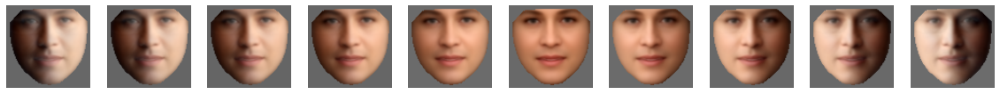

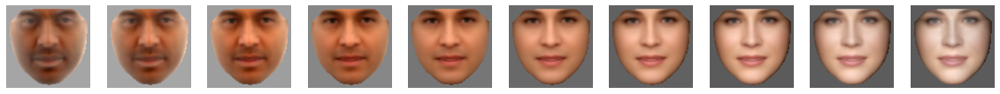

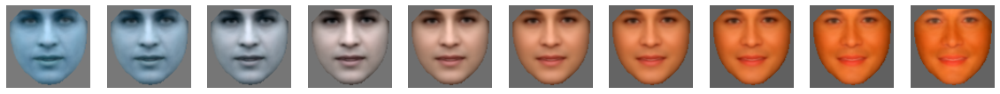

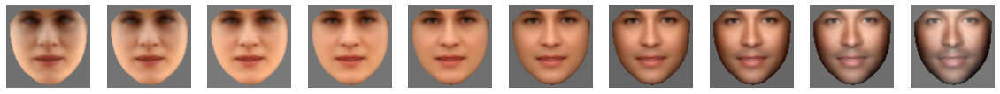

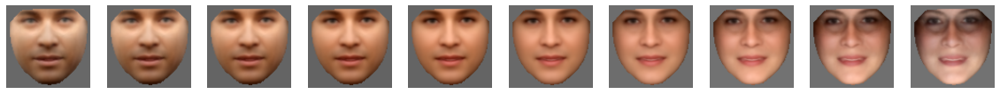

...

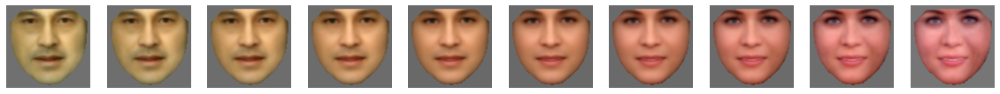

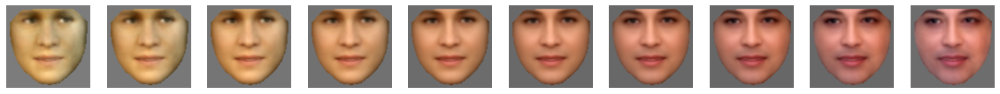

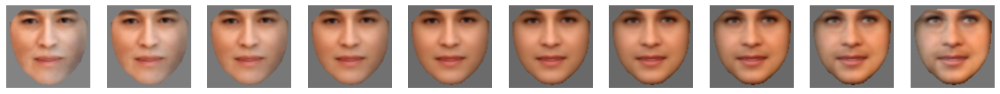

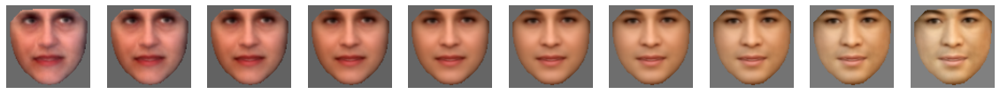

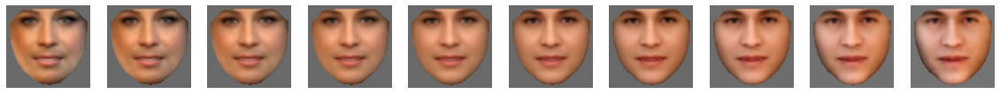

In [25]:
import matplotlib.pyplot as plt
import numpy as np

def plot_me(images):
    # Create a figure and subplots
    fig, axes = plt.subplots(1, 10, figsize=(20, 2))  # 10 columns, 1 row

    for ax, img in zip(axes, images):
        # Transpose the image to (height, width, channels) if necessary
        if img.shape[0] == 3:  # Check if channels are in the first dimension
            img = np.transpose(img, (1, 2, 0))  # Move channels to the last dimension
        
        # Normalize the image data to the range [0, 1]
        if img.dtype == np.float32 or img.dtype == np.float64:
            img_min = img.min()
            img_max = img.max()
            if img_max > 1.0 or img_min < 0.0:  # Check if normalization is needed
                img = (img - img_min) / (img_max - img_min)  # Normalize to [0, 1]
        
        ax.imshow(img)  # Display the RGB image
        ax.axis("off")  # Hide axes

    plt.show()

# Example usage:
# Assuming `images` is a list of 10 images with shape (3, height, width)
for i in range(20):
    sample = np.zeros(20)
    all_samples = []
    for j in range(10):
        sample[i] = (j - 5) 
        all_samples.append(get_sample(aam, [0], sample, save=False, save_path=None))
    plot_me(all_samples)

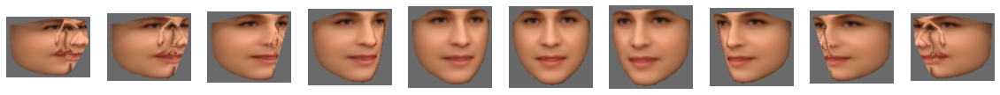

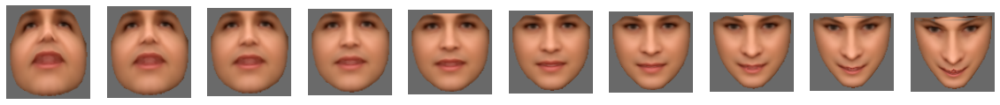

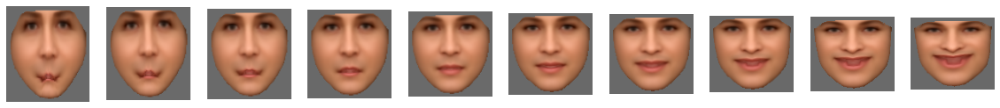

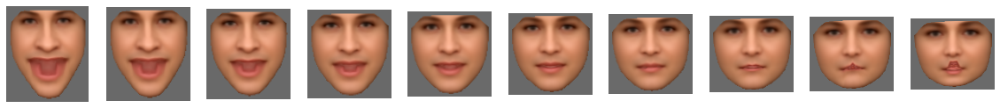

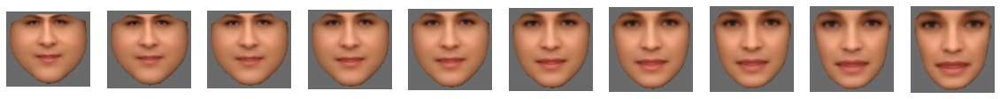

...

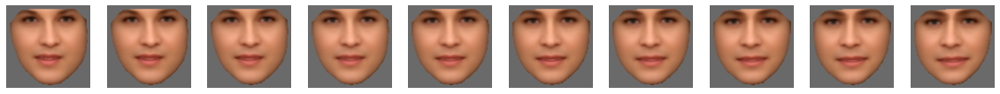

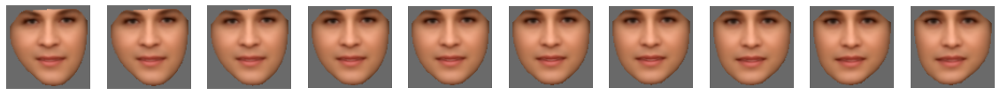

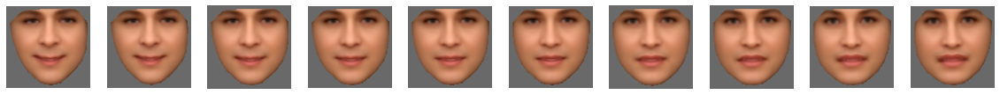

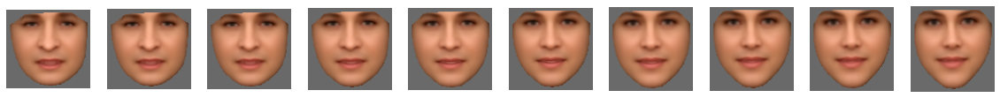

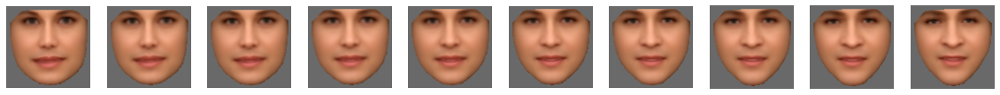

In [38]:
import matplotlib.pyplot as plt
import numpy as np

def plot_me(images):
    # Create a figure and subplots
    fig, axes = plt.subplots(1, 10, figsize=(20, 2))  # 10 columns, 1 row

    for ax, img in zip(axes, images):
        # Transpose the image to (height, width, channels) if necessary
        if img.shape[0] == 3:  # Check if channels are in the first dimension
            img = np.transpose(img, (1, 2, 0))  # Move channels to the last dimension
        
        # Normalize the image data to the range [0, 1]
        if img.dtype == np.float32 or img.dtype == np.float64:
            img_min = img.min()
            img_max = img.max()
            if img_max > 1.0 or img_min < 0.0:  # Check if normalization is needed
                img = (img - img_min) / (img_max - img_min)  # Normalize to [0, 1]
        
        ax.imshow(img)  # Display the RGB image
        ax.axis("off")  # Hide axes

    plt.show()

# Example usage:
# Assuming `images` is a list of 10 images with shape (3, height, width)
for i in range(20):
    sample = np.zeros(20)
    all_samples = []
    for j in range(10):
        sample[i] = (j - 5) 
        all_samples.append(get_sample(aam, sample,[0], save=False, save_path=None))
    plot_me(all_samples)

0


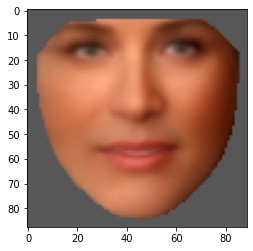

1


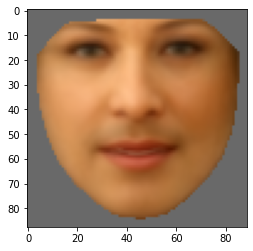

2


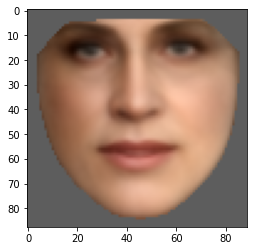

3


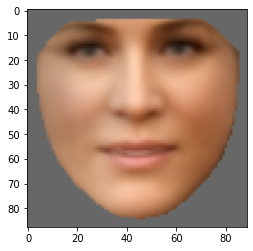

4


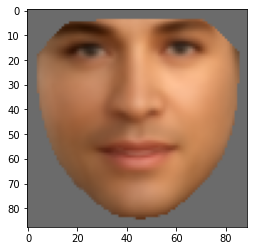

5


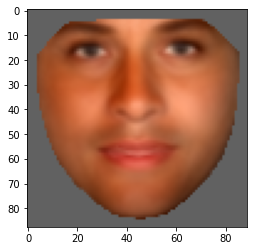

6


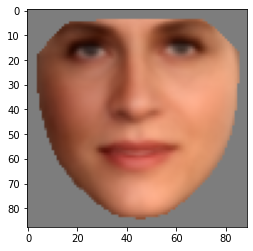

7


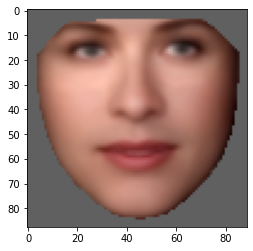

8


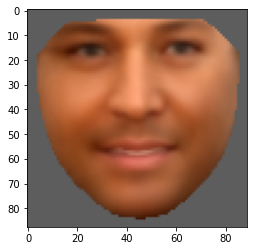

9


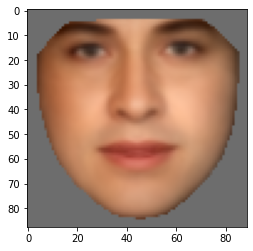

10


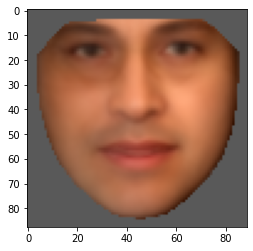

11


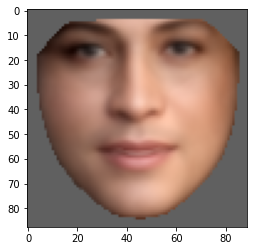

12


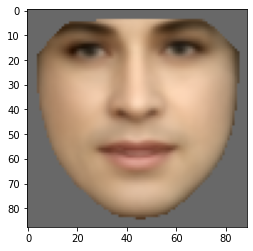

13


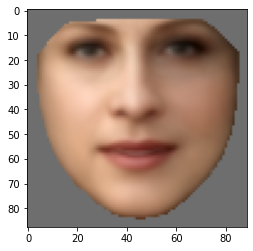

14


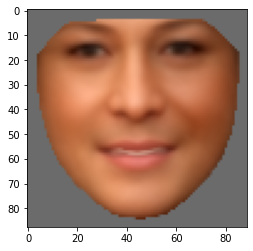

15


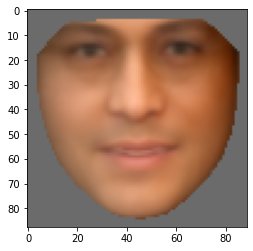

16


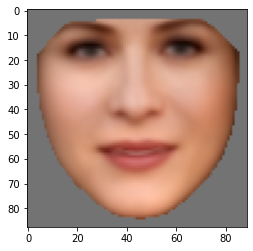

17


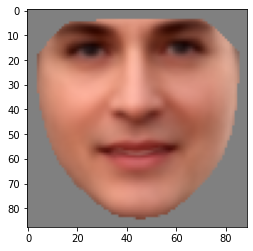

18


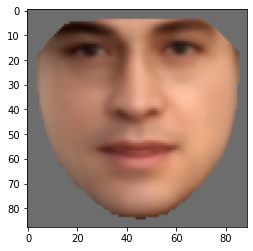

19


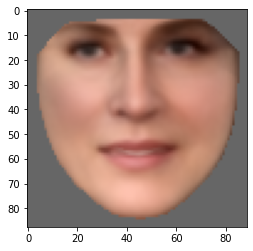

20


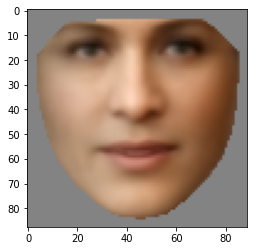

21


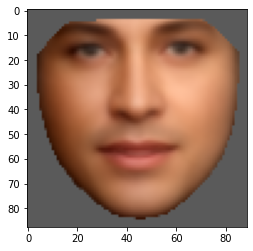

22


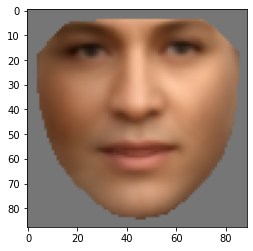

23


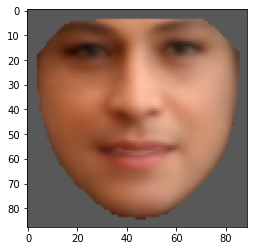

24


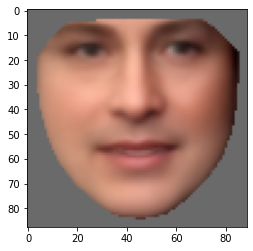

25


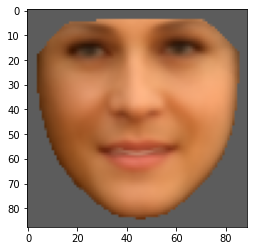

26


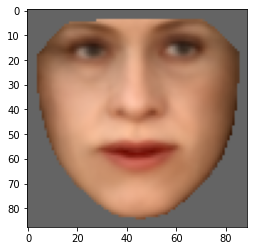

27


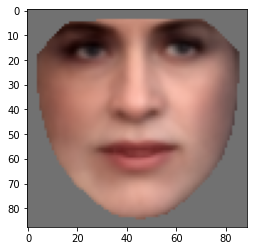

28


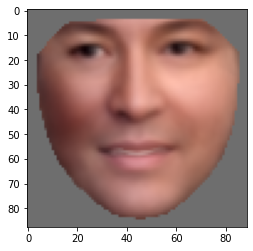

29


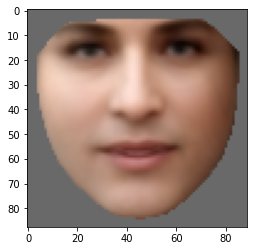

30


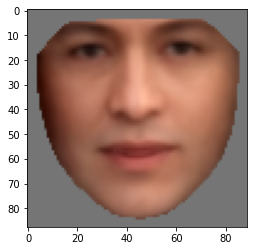

31


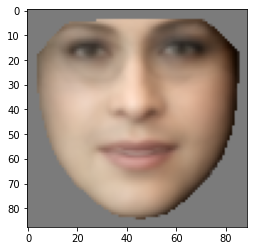

32


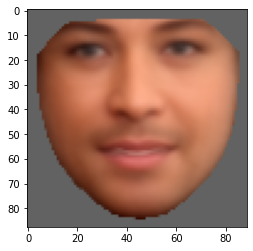

33


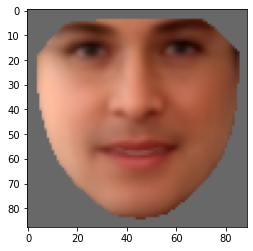

34


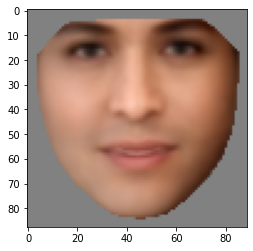

35


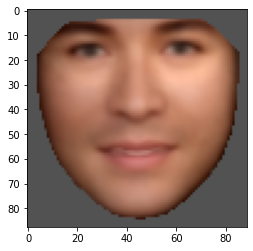

36


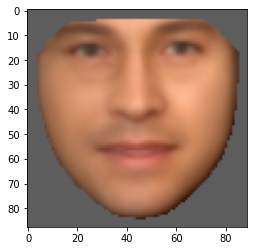

37


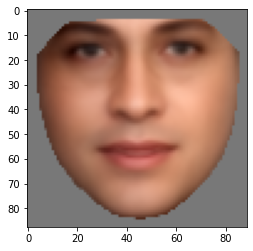

38


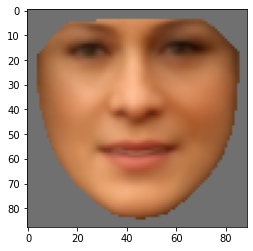

39


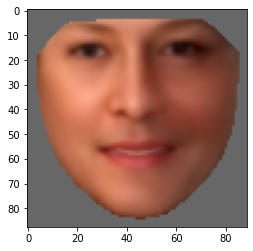

40


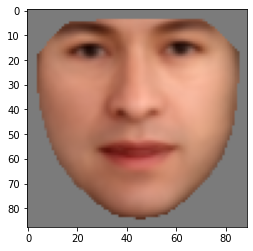

41


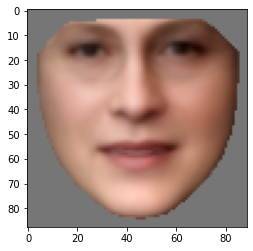

42


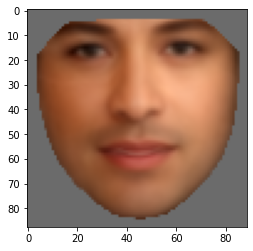

43


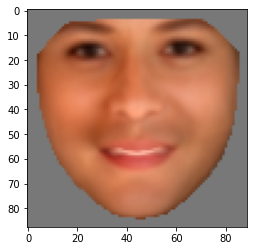

44


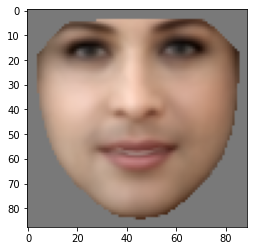

45


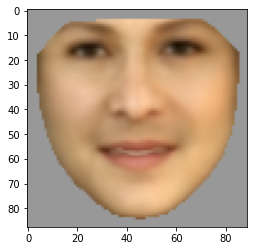

46


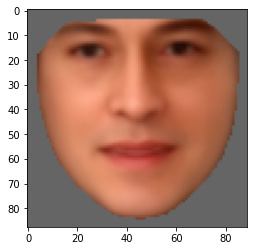

47


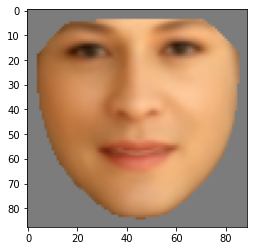

48


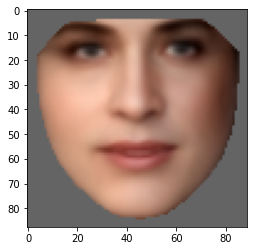

49


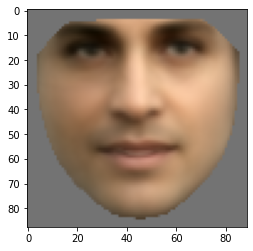

50


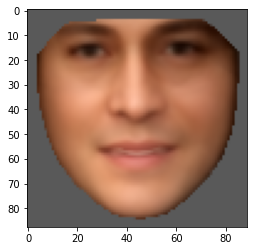

51


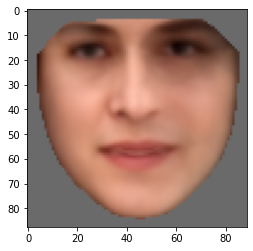

52


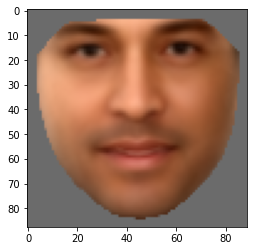

53


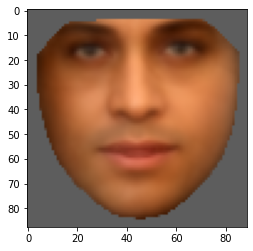

54


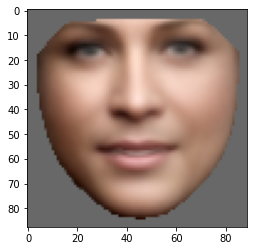

55


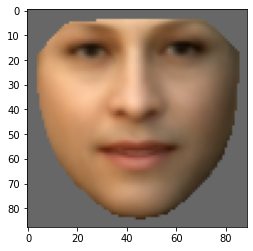

56


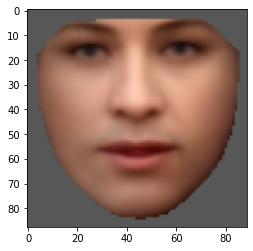

57


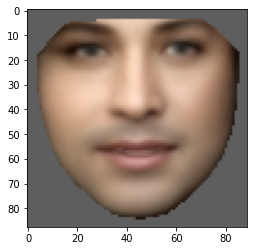

58


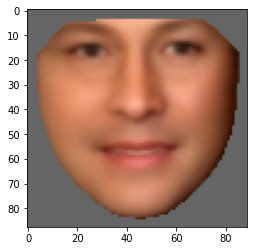

59


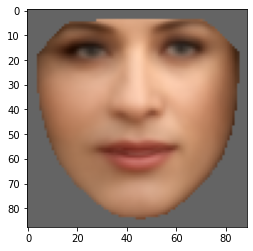

60


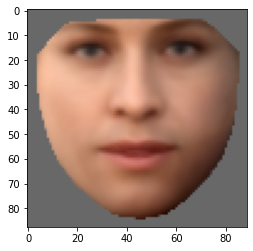

61


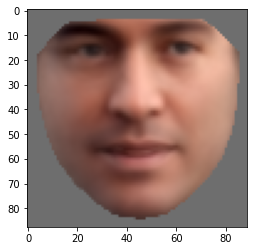

62


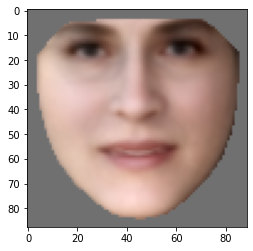

63


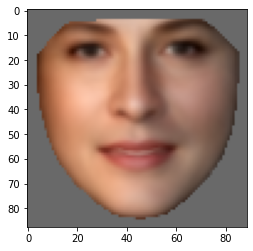

64


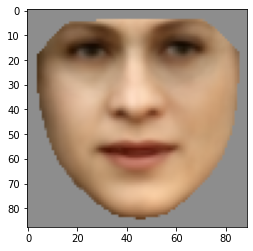

65


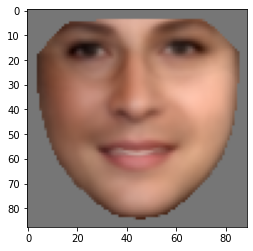

66


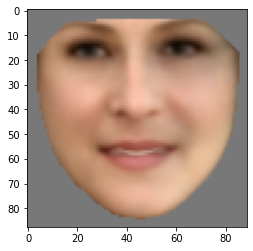

67


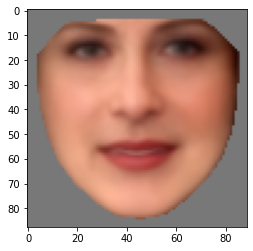

68


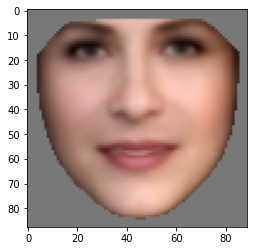

69


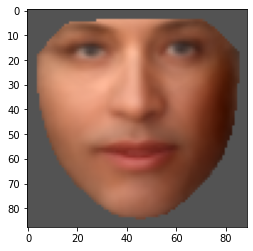

70


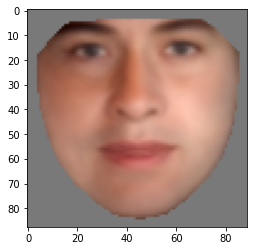

71


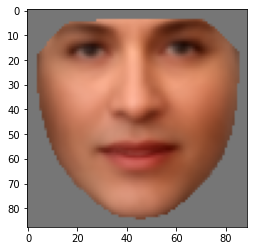

72


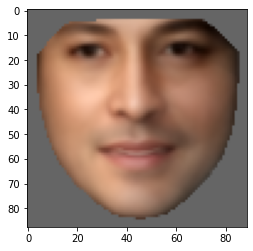

73


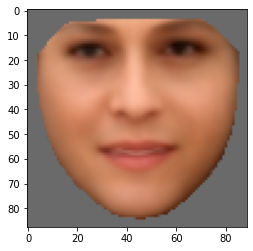

74


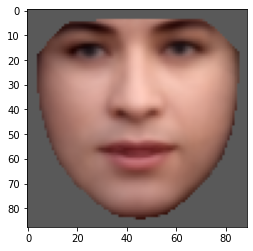

75


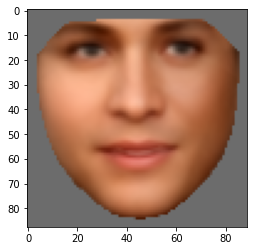

76


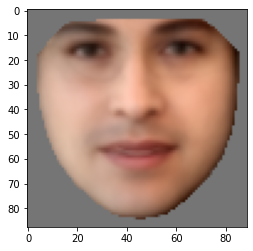

77


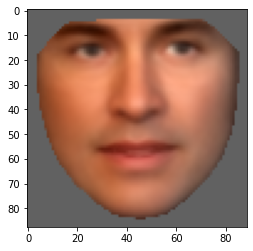

78


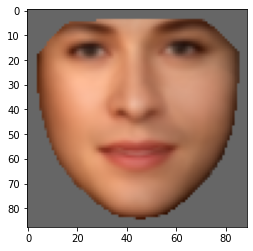

79


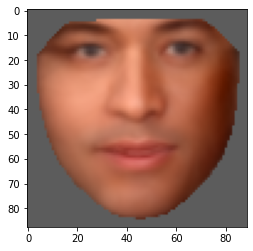

80


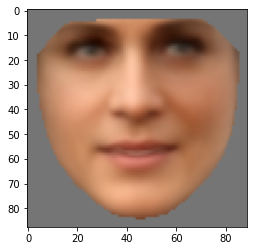

81


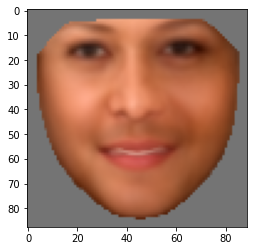

82


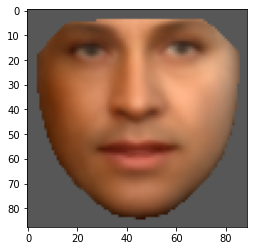

83


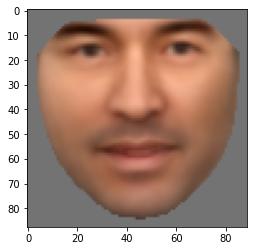

84


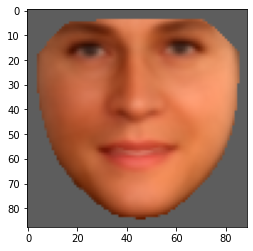

85


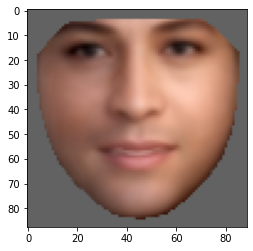

86


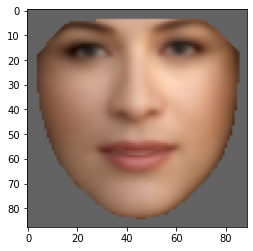

87


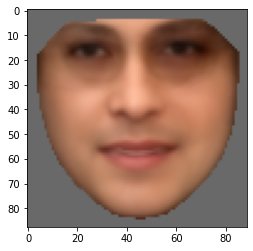

88


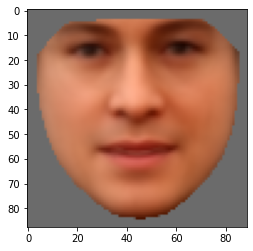

89


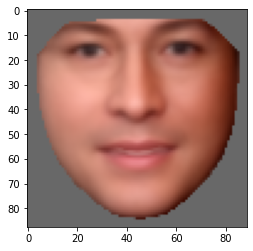

90


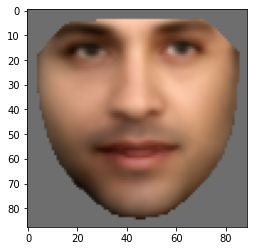

91


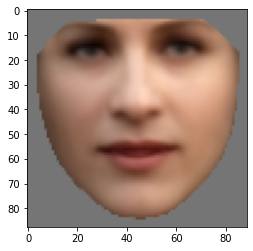

92


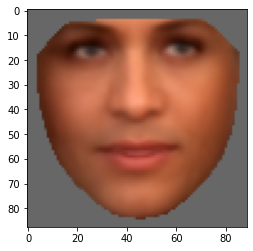

93


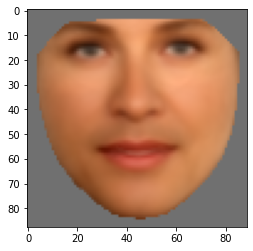

94


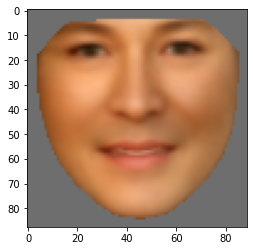

95


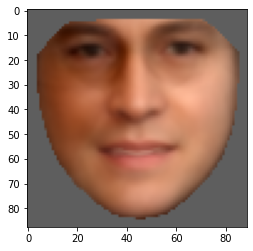

96


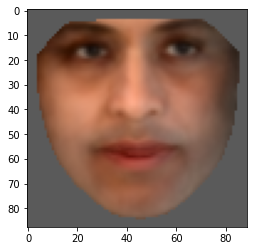

97


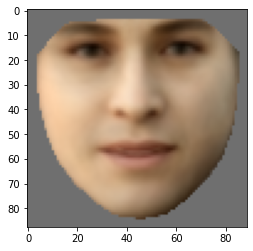

98


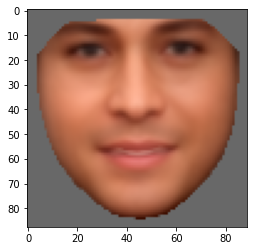

99


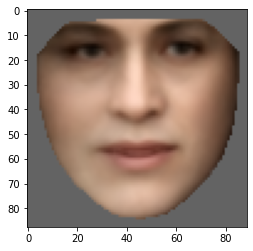

In [41]:
latents_shape=[]
latents_appearnace=[]
for _ in range(100):
    print(_)
    latents_shape.append(np.random.uniform(-1,1,20))
    latents_appearnace.append(np.random.uniform(-1,1,20))
    plt.imshow(get_sample(aam, [0,0].extend(latents_shape[-1]), latents_appearnace[-1], save=False, save_path=None))
    plt.show()
    

In [20]:
# samples=range(2000)
# all_samples=[]
# i=0
# for sample_ in samples:
#     i+=1
#     sample=np.random.uniform(-2,2,20)
#     get_sample(aam, [0], sample, save=True, save_path=rf'/home/data/samples_generated/{i+1000}.png')


[ 0.54105273  0.68417546  1.08190292 -1.3018569   1.90472257  1.35619727
  1.10119988 -0.42068818  0.73258982 -0.24394132 -0.0790449  -1.87615168
 -0.94819039  0.24065787 -1.99589378  0.03272062  0.62823093 -0.88281217
 -0.19442061  1.27118964]
(88, 89, 3)
[ 1.79387477 -1.70130938  1.25361051  0.19345118 -0.63875351 -1.08922239
  0.9834695   1.7117812   1.19018862 -1.08780911 -1.82150886  0.22433428
  1.28313826 -0.20071818 -1.12328412 -0.11752878  0.60202306 -0.30329425
  1.19426217 -0.26206499]
(88, 89, 3)
[ 0.83527257 -0.7570173   0.20723668  1.15086958  0.74991102  0.09639717
  0.12039018  1.66152974 -0.39572745  0.94244357  0.97945543 -1.02905261
  1.17603478  0.6148942  -0.61025615  0.1272337   1.82151999  0.72554022
 -1.5076252   1.71179514]
(88, 89, 3)
[ 0.21102436 -1.27358234  1.80399539  0.04306092  0.68856179 -0.84704593
  1.11914273 -1.79009149  1.09110046 -1.18230436 -1.6474861   0.47381357
 -1.64560212 -1.49397571  0.82264057  0.59444365  1.60951679  0.52254552
 -1.701930

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np

def interpolate_points(p1, p2, n):
    """
    Generate `n` points between two 20-dimensional points `p1` and `p2`.

    Parameters:
    p1 (array-like): First 20-dimensional point.
    p2 (array-like): Second 20-dimensional point.
    n (int): Number of points to generate.

    Returns:
    numpy.ndarray: Array of shape (n, 20) containing the interpolated points.
    """
    return np.linspace(p1, p2, num=n, endpoint=False)


def plot_images_in_row(images):
    """
    Plots images in a single row.
    
    Parameters:
    images (list or array): List of images as numpy arrays (e.g., shape (H, W) or (H, W, C))
    """
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=(n * 2, 2))  # Adjust figure size based on n
    if n == 1:
        axes = [axes]  # Ensure axes is iterable for a single image
    for ax, img in zip(axes, images):
        image_array = np.array(img)  # Convert Menpo Image to NumPy array
        image_array = (image_array - image_array.min()) / (image_array.max() - image_array.min())  # Normalize to [0,1]

        
        ax.imshow(np.transpose(image_array, (1, 2, 0)))  # Auto-detect grayscale or RGB
        ax.axis('off')  # Hide axes
    plt.tight_layout()
    plt.show()
import numpy as np

def random_points_on_hypersphere(center, radius, num_points=10):
    dim = len(center)  # Get the dimensionality (20 in this case)
    
    # Generate random points from a normal distribution
    random_directions = np.random.randn(num_points, dim)
    
    # Normalize them to lie on the unit hypersphere
    unit_vectors = random_directions / np.linalg.norm(random_directions, axis=1, keepdims=True)
    
    # Scale by the desired radius and shift by the center
    points = center + radius * unit_vectors
    
    return points


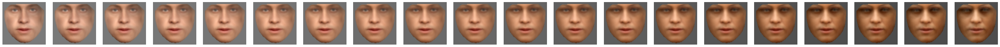

In [7]:
# man-man
man_1=np.zeros(20)
man_1[12]=-4
man_2=np.zeros(20)
man_2[8]=-4
interpolated_points = interpolate_points(man_1,man_2,20)
images=[]
for sample in interpolated_points:
    images.append(aam.instance(shape_weights=[0], appearance_weights=sample).pixels)
plot_images_in_row(images)

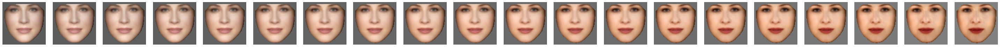

In [8]:
# woman-woman
woman_1=np.zeros(20)
woman_1[1]=4
woman_2=np.zeros(20)
# woman_2[14]=-3
woman_2[9]=4
interpolated_points = interpolate_points(woman_1,woman_2,20)
images=[]
for sample in interpolated_points:
    images.append(aam.instance(shape_weights=[0], appearance_weights=sample).pixels)
plot_images_in_row(images)

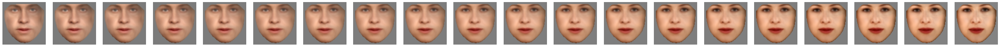

In [9]:
# man-woman
interpolated_points = interpolate_points(man_1,woman_2,20)
images=[]
for sample in interpolated_points:
    images.append(aam.instance(shape_weights=[0], appearance_weights=sample).pixels)
plot_images_in_row(images)

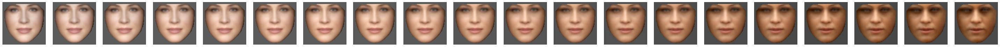

In [10]:
# woman_man
interpolated_points = interpolate_points(woman_1,man_2,20)
images=[]
for sample in interpolated_points:
    images.append(aam.instance(shape_weights=[0], appearance_weights=sample).pixels)
plot_images_in_row(images)

In [60]:
p1=man_1
p2=man_2
direction_1=(p2-p1)
direction_2=find_orthogonal_vector(p2-p1)
direction_1/=np.linalg.norm(direction_1)
direction_2/=np.linalg.norm(direction_2)

In [57]:
import time
import random
def step(start,target,direction_1,direction_2,step_size=1):
#     t=time.time()
    new_points=[start+direction_1*step_size,start-direction_1*step_size,start+direction_2*step_size,start-direction_2*step_size]
    news=[start+direction_1*step_size,start-direction_1*step_size,start+direction_2*step_size,start-direction_2*step_size]
    images=[]
#     random.shuffle(new_points)
    randoms=[0,1,2,3]
    random.shuffle(randoms)

    for i in randoms:
        images.append(aam.instance(shape_weights=[0], appearance_weights=new_points[i]).pixels)
    plot_images_in_row([aam.instance(shape_weights=[0], appearance_weights=target).pixels])
    plot_images_in_row(images)
#     best_index = next(i for i, p in enumerate(new_points) if np.all(p == start + direction_1))
    best_index = (i for i, p in enumerate(new_points) if np.all(p == start + direction_1))


    response = input(f'Your Choice (best={randoms.index(0)+1}):')

#     t=time.time()-t
    return response,0,new_points[int(response)-1]


In [39]:
best_index

NameError: name 'best_index' is not defined

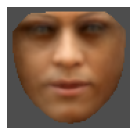

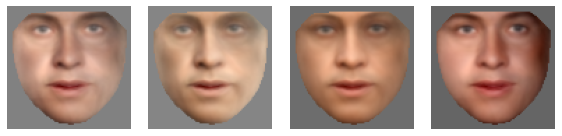

Your Choice (best=3):3


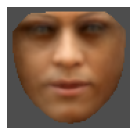

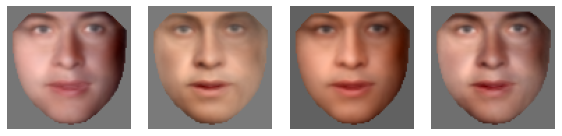

Your Choice (best=3):3


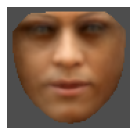

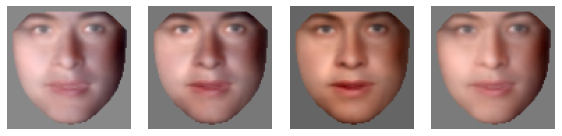

Your Choice (best=4):4


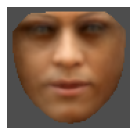

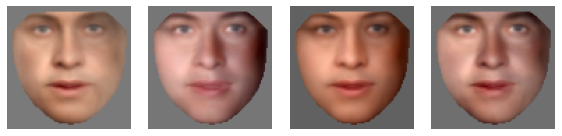

Your Choice (best=3):3


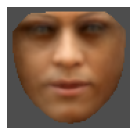

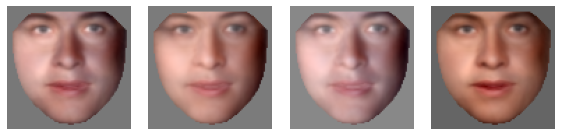

Your Choice (best=2):2


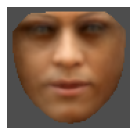

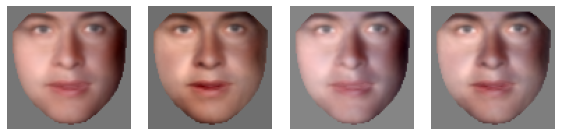

In [ ]:
# trajectory=[]
start=man_1
target=man_2
threshold=1 #JND
max_trials=20
point=None
trial=0
for trial in range(max_trials):
    response,time,point=step(point if trial else start ,target,direction_1,direction_2,step_size=2)
    trajectory.append([response,time,point])
    if(np.linalg.norm(point-target)<threshold):
        print('Good job! You reached the target!')
        break
    

In [21]:
for sample in trajectory:
    print(np.linalg.norm(sample[2]-target))

3.845707929989856
4.645313656317916
3.776934003472786
5.390241177292147
3.7769340034727854
5.390241177292147
7.200289538078501
5.390241177292147
3.7769340034727854
5.390241177292147
3.7769340034727854
3.866719794296479
2.8569306055305828
4.1046734323003795
4.249573449541226
4.1046734323003795
2.8569306055305828
4.1046734323003795
4.249573449541226
3.061467458920718


In [52]:
import pickle
import numpy as np
subject=input('Subject Name:')
with open(f"traj_{subject}.pkl", "wb") as f:
    pickle.dump(trajectory, f)


Subject Name:Kowsar
